## Analyse mouse brain cut for Xenium-benchmark analysis

This notebook runs a vanilla SSAM analysis on the msBrain data set from our Xenuim-benchmark experiments. 
SSAM de-novo is used to identify gene expression clusters. Correlation analysis with single-cell data (Yao, 2020) is used to assign clusters to known cell types. Ill-assigned clusters are then manually corrected to produce the final celltype maps.

In [1]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))


#### imports 

In [2]:
import os
from collections import defaultdict

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn import preprocessing

import ssam

import zarr

#### parameters

In [3]:

# global parameters
um_per_pixel = 1
ncores = 40 # Number of cores used for kernel density estimation

# SSAM algorithm parameters
bw=3  # this should be set according to molecule density. 2-4 is a good range to explore.

# local max params
local_max_min_expression=0.027 # this doesnt seem to change when bw is set to 2.5
local_max_min_norm=0.1 # this should be investigated and set. No guidelines right now. def 0.2.
local_max_search_size=3 # not sure of effect
local_max_ext="exp"+str(local_max_min_expression)+"norm"+str(local_max_min_norm)

# clustering
clust_vec_min_cluster_size=0 # can be increased for only robest types... or reduced for rare
clust_vec_pca_dims=60 # perhaps this should be set to the tSNE and UMAP components?
clust_vec_resolution=0.1 # this is the Louvain resolution. Higher means fewer clusters.
clust_vec_metric='correlation'
clust_vec_ext="minsize"+str(clust_vec_min_cluster_size)+"pca"+str(clust_vec_pca_dims)+"res"+str(clust_vec_resolution)

# # UMAP/tSNE params
# num_p_componants=22 # used for tSNE and UMAP. Harmonise with clust_vec_pca_dims?
# tsne_s=10 # size of spots in scatter plot
# tsne_ext="pca"+str(num_p_componants)+"s"+str(tsne_s)
# umap_ext="pca"+str(num_p_componants)

# cell type map filtering
filter_method = "local"
filter_params = {
    "block_size": 151,
    "method": "mean",
    "mode": "constant",
    "offset": 0.1
}
filter_cmap_min_r=0.6 # minimum correlation to be considered for annotation
filter_cmap_min_blob_area=50 # minimum size of annotated area to filter small local noise
cmap_ext="minR"+str(filter_cmap_min_r)+"minBlob"+str(filter_cmap_min_blob_area)

# # domain params
# domains_step=10
# domain_radius=50
# domain_n_clusters=20
# domain_merge_remote=True
# domain_merge_thres=0.7
# domain_local_norm_thresh=1500
# domain_extension="step"+str(domains_step)+"rad"+str(domain_radius)+"nclus"+str(domain_n_clusters)+"merge"+str(domain_merge_remote)+str(domain_merge_thres)+"norm"+str(domain_local_max_min_norm)



#### define data 

In [4]:
data_root = '../../data/'
output_root = '../../output'
project_subfolder = 'xenium_prerelease_jun20_mBrain_replicates_update_Sept_25/mBrain_ff_rep1'

# '/dh-projects/ag-ishaque/analysis/tiesmeys/xenium-benchmark/\
# data/xenium_prerelease_jun20_mBrain_replicates_update_Sept_25/mBrain_ff_rep1'

# coordinate_file = os.path.join(data_root,project_subfolder,'transcripts.csv')

# # create output folder:
# os.makedirs(os.path.join(output_root,project_subfolder),exist_ok=True)

import anndata

adata = anndata.read_h5ad('../../data/mBrain/ms_brain_rep2.h5ad','r')


In [5]:
# dapi_img = plt.imread(os.path.join('./morphology_mip.ome.jpg')).T

In [6]:

adata.uns['spots']

,cell_id,overlaps_nucleus,feature_name,x_location,y_location,z_location,qv
transcript_id,,,,,,,
281496451547136,5335,1,Dkk3,108.882760,1191.4623,15.111133,14.470180
281496451547137,4908,1,Neurod6,599.608800,1214.9828,13.810570,17.666338
281496451547138,7469,1,Ipcef1,40.342777,1966.5145,14.667373,9.514981
281496451547139,7485,1,Bhlhe40,34.722248,2017.1637,15.058671,13.275211
281496451547140,4905,1,Car4,623.589000,1048.9484,15.842804,29.903952
...,...,...,...,...,...,...,...
281513631904696,28317,1,Cdh13,2738.748300,1722.5444,28.736680,14.214149
281513631904697,28334,1,Fign,2618.527000,1743.7420,29.148848,40.000000
281513631904698,2563,1,Zfp536,2907.959700,1812.5348,28.413157,15.674445


#### import cell segmentation data

In [7]:
import PIL.ImageDraw as ImageDraw
import PIL.Image as Image



import zarr

zarr_file = zarr.open('../../data/xenium_prerelease_jun20_mBrain_replicates/mBrain_ff_rep2/cell_segmentation_dataset.zarr.zip',mode='r')
# list(zarr_file.keys())


# cell_polygons = zarr_file['polygon_vertices']
# cell_segment_image = Image.new("RGBA", (np.ceil(cell_polygons[:,:,::2].max()).astype(int),np.ceil(cell_polygons[:,:,1::2].max()).astype(int)),color=(0,0,0,0))
# draw = ImageDraw.Draw(cell_segment_image)

# for i in range(cell_polygons.shape[1]):
#     draw.polygon((cell_polygons[0,i].reshape((-1,2))),outline='royalblue')
#     draw.polygon((cell_polygons[1,i].reshape((-1,2))),outline='white')


In [8]:
list(zarr_file.keys())

cell_segmentation_mask = np.array(zarr_file['masks'][1])

In [9]:
cell_annotatons = pd.read_csv('../../data/mBrain/mousebrain_rep2.csv',index_col=0)
cell_annotatons

,index,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,total_counts,cell_area,nucleus_area,...,leiden_0_8,leiden_0_6,Class,initial_annotation,celltype_annotation,cell_code,X,Y,X_umap,Y_umap
26372,0,1,178.828415,24.717344,138,0,0,138.0,418.056562,40.098750,...,8,7,Excitatory,29_L6B_ctx,L6B_ctx,1_2,841.545061,116.316856,2.924479,3.485298
26373,1,2,186.253006,8.458055,38,0,0,38.0,245.920938,10.115000,...,6,2,Astro,10_Astro,Astro,2_2,876.484296,39.802590,4.213676,-4.044210
26374,2,3,202.143433,6.923799,19,0,0,19.0,280.510625,13.501719,...,6,2,Astro,10_Astro,Astro,3_2,951.262737,32.582565,4.502540,-3.781241
26375,3,4,199.003693,26.451843,139,0,0,139.0,483.487969,40.189062,...,6,2,Astro,10_Astro,Astro,4_2,936.487497,124.479200,3.301719,-3.376107
26376,4,5,224.139435,10.844007,79,0,0,79.0,495.544688,34.725156,...,6,2,Astro,10_Astro,Astro,5_2,1054.773284,51.030593,3.769324,-3.679125
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56458,30086,30087,2674.850830,3443.191895,227,0,0,227.0,246.282187,37.976406,...,8,7,Excitatory,6_L6 CT CTX,L6 CT CTX,30087_2,12587.527024,16203.247873,3.552261,4.716935
56459,30087,30088,2661.366699,3478.147461,271,0,0,271.0,245.695156,49.762188,...,8,7,Excitatory,6_L6 CT CTX,L6 CT CTX,30088_2,12524.072323,16367.744573,3.793444,5.188894
56460,30088,30089,2678.595703,3454.411133,194,0,0,194.0,160.711094,26.371250,...,15,13,Microglia,15_Microglia,Microglia,30089_2,12605.149947,16256.044262,1.902864,-0.181710
56461,30089,30090,2683.478516,3409.250488,234,0,0,234.0,319.345000,27.274375,...,8,7,Excitatory,6_L6 CT CTX,L6 CT CTX,30090_2,12628.127877,16043.523688,3.593165,4.262542


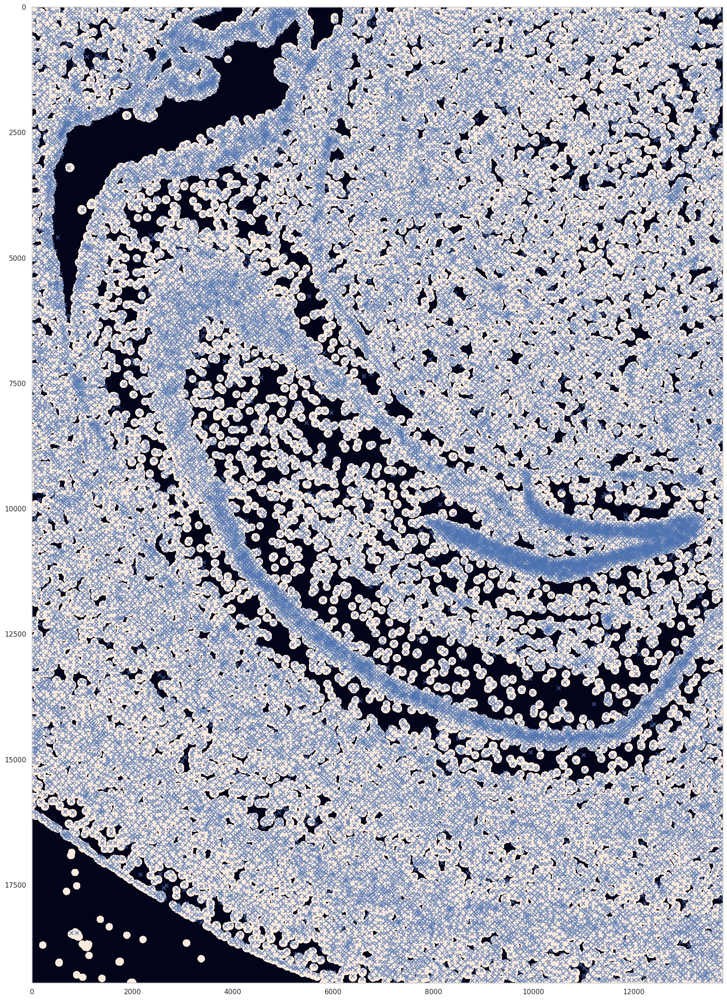

In [10]:
plt.figure(figsize=(20,30))

plt.imshow(cell_segmentation_mask>0,interpolation='none')

plt.scatter(*np.array(cell_annotatons[['x_centroid','y_centroid']]).T*4.7,marker='x',alpha=0.8)

#### import/pre-process data

In [11]:
df = pd.DataFrame(adata.uns['spots'].loc[:,['x_location', 'y_location','z_location','feature_name']])#read_csvcoordinate_file,usecols=['x_location', 'y_location', 'feature_name'])

df = df[~df.feature_name.str.contains('DUMMY')]

df['x_location']=(df.x_location-df.x_location.min())/um_per_pixel+5
df['y_location']=(df.y_location-df.y_location.min())/um_per_pixel+5
df['z_location']=(df.z_location-df.z_location.min())/um_per_pixel+5

df['z_location']-=(df.y_location/500+df.x_location/400)
df['z_location']=(df.z_location-df.z_location.min())/um_per_pixel+5

pos_dic = defaultdict(lambda: [])

xmin,xmax = df.x_location.min(), df.x_location.max()+5
ymin,ymax = df.y_location.min(), df.y_location.max()+5
zmin,zmax = df.z_location.min(), df.z_location.max()+5

width = int(xmax-xmin)
height = int(ymax-ymin)
depth = int(zmax-zmin)

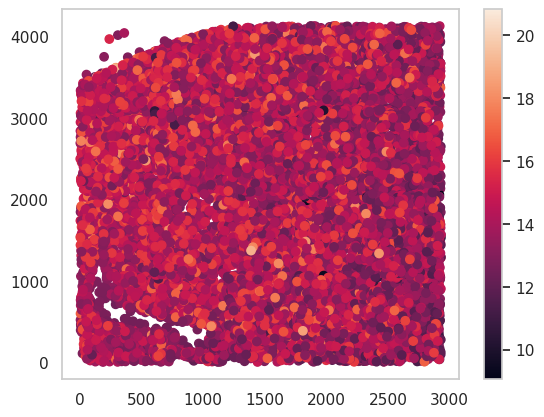

In [12]:
# df.to_csv('aligned_coordinates.csv')

plt.scatter(df.x_location[::400],df.y_location[::400],c=df.z_location[::400])
plt.colorbar()

In [13]:
signature_path = '/dh-projects/ag-ishaque/analysis/tiesmeys/xenium-benchmark/data/mBrain/mean_expression-20221009T190945Z-001/mean_expression/mean_expression_Yao_150kcells_384_ref_cluster_label.csv'

signatures = pd.read_csv(signature_path,
                         index_col=0).T

signatures

unique_genes = df.feature_name.unique()
gene_intersection = signatures.index[signatures.index.isin(unique_genes)]

signatures = signatures.loc[signatures.index.isin(gene_intersection)]
signatures = signatures.sort_index()

df_sync = df[df.feature_name.isin(gene_intersection)]

signatures = signatures.loc[gene_intersection]
# sdata = sdata[sdata.g.isin(gene_intersection)]

# sdata = sdata.clean()


In [14]:
# signatures_normalized = preprocessing.normalize(signatures,axis=0)
# signatures_normalized = preprocessing.normalize(signatures_normalized,axis=1)#np.nan_to_num(signatures/signatures.sum(0))

In [15]:
for gene in signatures.index:
    pos_dic[gene]=np.array(df[df.feature_name==gene][['x_location','y_location']])#,'z_location']])

In [16]:
all_genes = list(signatures.index)
ds = ssam.SSAMDataset(all_genes, [pos_dic[gene] for gene in all_genes], width, height)

In [17]:
analysis = ssam.SSAMAnalysis(ds, ncores=ncores, verbose=True, save_dir = "./../../output/xenium_prerelease_jun20_mBrain_replicates/mBrain_ff_rep/ssam-temp")

analysis.run_fast_kde(bandwidth=bw/um_per_pixel, use_mmap=False,re_run=True)

Processing gene Slc17a7...
Processing gene Nrn1...
Processing gene Epha4...
Processing gene Serpine2...
Processing gene Gfap...
Processing gene Clmn...
Processing gene Neurod6...
Processing gene 2010300C02Rik...
Processing gene Dner...
Processing gene Tubb2a...
Processing gene Cabp7...
Processing gene Dpy19l1...
Processing gene Cpne6...
Processing gene Id2...
Processing gene Dkk3...
Processing gene Cux1...
Processing gene Kctd12...
Processing gene Acsbg1...
Processing gene Rorb...
Processing gene Garnl3...
Processing gene Cpne4...
Processing gene Calb1...
Processing gene Ntsr2...
Processing gene Nrep...
Processing gene Rmst...
Processing gene Car4...Processing gene Gjc3...Processing gene Arhgap12...


Processing gene Gng12...
Processing gene Gad1...
Processing gene Bhlhe40...
Processing gene Aqp4...
Processing gene Rims3...
Processing gene Necab1...Processing gene Igfbp5...

Processing gene Dnajc21...
Processing gene Rasgef1b...
Processing gene Arc...
Processing gene Slc39a12...
Proces

In [18]:
local_max_min_norm = 0.05
local_max_min_expression = 0.01
local_max_search_size = 3


analysis.find_localmax(search_size=local_max_search_size, min_norm=local_max_min_norm, min_expression=local_max_min_expression)

analysis.normalize_vectors()

Found 34767 local max vectors.


Text(0.5, 1.0, 'localmax sampling locations')

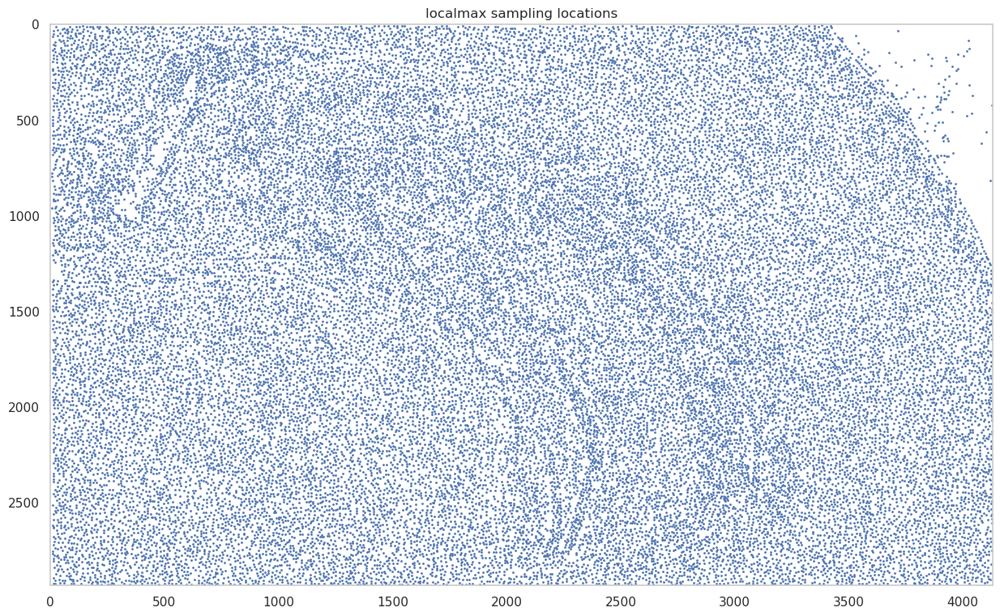

In [21]:
plt.figure(figsize=(15,9))
ds.plot_localmax()
plt.title('localmax sampling locations')

In [22]:
# clustering
clust_vec_min_cluster_size=5 # can be increased for only robest types... or reduced for rare
clust_vec_pca_dims=50 # perhaps this should be set to the tSNE and UMAP components?
clust_vec_resolution=0.3 # this is the Louvain resolution. Higher means fewer clusters.
clust_vec_metric='correlation'
clust_vec_ext="minsize"+str(clust_vec_min_cluster_size)+"pca"+str(clust_vec_pca_dims)+"res"+str(clust_vec_resolution)


analysis.cluster_vectors(
    min_cluster_size=clust_vec_min_cluster_size,
    pca_dims=clust_vec_pca_dims,
    resolution=clust_vec_resolution,
    metric=clust_vec_metric)

Found 91 clusters


In [23]:

analysis.map_celltypes()#centroids=np.array(signatures_normalized).T)


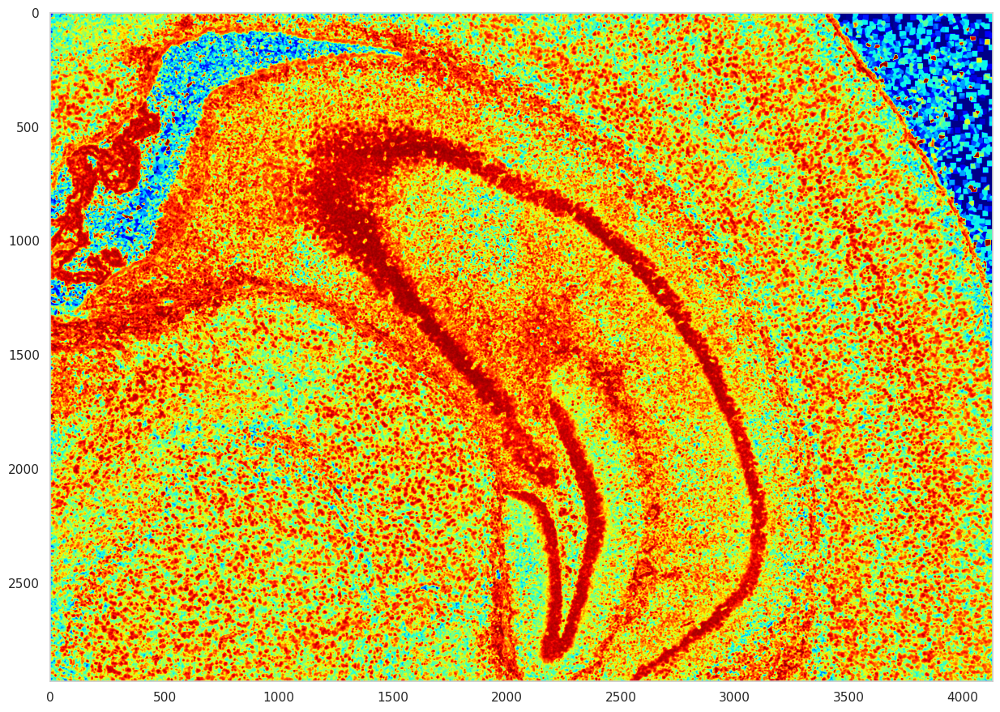

In [24]:
plt.figure(figsize=(15,15))

plt.imshow(ds.max_correlations[:,:,0],cmap='jet')

In [25]:

filter_params = {
    "block_size":61,
    "method": "gaussian",
#     "mode": "constant",
    "offset": 0.05
}

analysis.filter_celltypemaps(min_norm = 'local', 
                             filter_params=filter_params, 
                             min_r=0.3,
                             fill_blobs=True, 
                             min_blob_area=30)


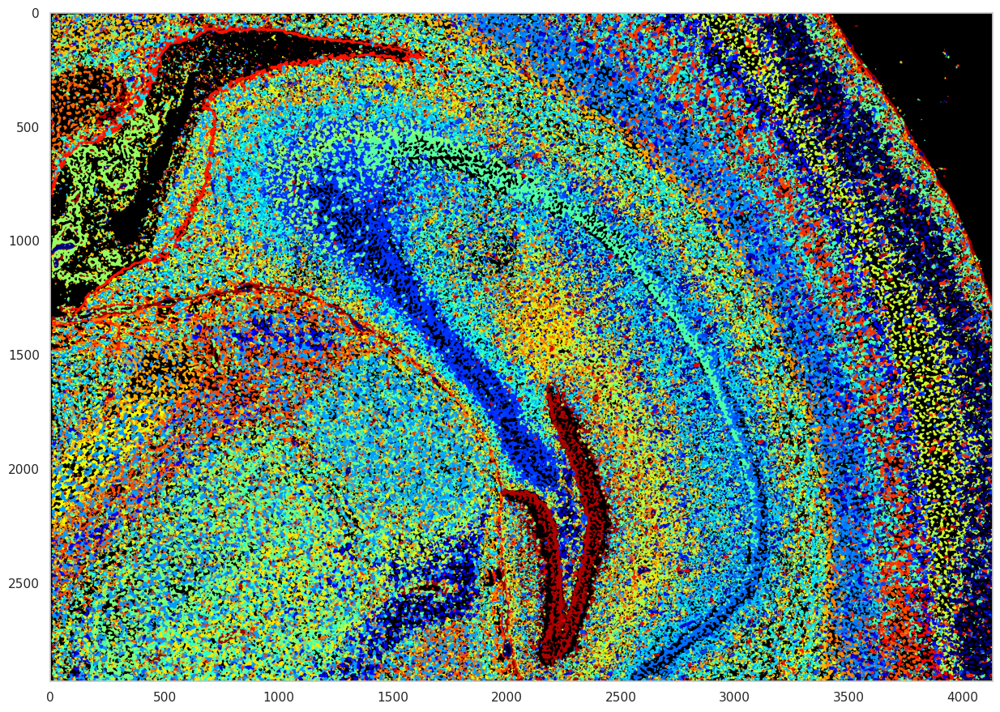

In [26]:
plt.figure(figsize=(15,15))
ds.plot_celltypes_map()

In [27]:
signatures = pd.read_csv("../../data/mBrain/mean_expression-20221009T190945Z-001/mean_expression/mean_expression_Yao_150kcells_42_subclass_label.csv",index_col=0)

In [28]:
signatures = signatures[ds.genes]
signatures

,Sox17,Cpa6,Col19a1,2010300C02Rik,Pantr1,Satb2,Nrp2,Spag16,Vwc2l,Fn1,...,Mapk4,Tle4,Pcsk5,Rorb,Pip5k1b,Acta2,Rbp4,Opalin,Sorcs3,Slc18a2
Astro,0.000000,0.010965,0.015351,0.037281,1.844298,0.032895,0.059211,0.019737,0.000000,0.002193,...,0.899123,0.526316,0.006579,4.317983,0.063596,0.000000,0.002193,0.000000,0.035088,0.000000
CA1-ProS,0.000000,0.077931,0.030345,3.165517,3.697241,1.389655,0.463448,0.110345,0.043448,0.008276,...,1.271034,0.390345,0.305517,0.028966,2.996552,0.001379,0.037241,0.000690,4.681379,0.011724
CA3,0.000000,0.089172,0.312102,2.076433,0.235669,0.063694,4.356688,0.133758,0.121019,0.000000,...,0.375796,1.356688,0.923567,0.082803,1.840764,0.000000,0.006369,0.006369,2.299363,0.197452
CR,0.000000,0.205882,0.029412,0.029412,0.147059,0.029412,0.029412,0.088235,0.029412,0.000000,...,0.205882,0.676471,0.205882,0.029412,0.323529,0.000000,0.000000,0.000000,0.264706,0.000000
CT SUB,0.001848,0.044362,0.103512,0.469501,0.508318,0.114603,0.615527,0.038817,0.393715,0.020333,...,0.393715,1.918669,0.935305,1.957486,0.325323,0.000000,0.040665,0.000000,0.872458,0.001848
Car3,0.000577,0.055956,0.411595,0.989616,1.747332,6.313528,0.803000,0.065474,0.812806,0.004038,...,2.687338,0.465532,1.633401,0.389962,0.533603,0.007788,0.031728,0.003750,6.436400,0.008076
DG,0.000183,0.040981,0.026894,2.510977,0.269667,0.029272,0.750823,0.016465,0.004208,0.001281,...,0.775338,0.490853,0.707464,0.024698,3.266923,0.000732,0.019027,0.000549,0.433955,0.005306
Endo,1.390625,0.000000,0.031250,0.023438,0.023438,0.039062,0.140625,0.023438,0.000000,2.476562,...,0.000000,0.132812,0.031250,0.007812,0.351562,0.000000,0.000000,0.000000,0.031250,0.000000
IG-FC,0.000000,0.000000,0.018349,9.000000,0.467890,0.073394,1.366972,0.000000,0.000000,0.000000,...,0.761468,0.394495,0.055046,1.348624,7.311927,0.000000,0.018349,0.073394,0.440367,0.009174
L2 IT ENTl,0.000000,0.071203,0.049051,3.113924,0.243671,0.354430,1.943038,0.085443,0.161392,0.014241,...,1.199367,0.662975,0.166139,0.881329,1.675633,0.000000,0.020570,0.003165,0.949367,0.007911


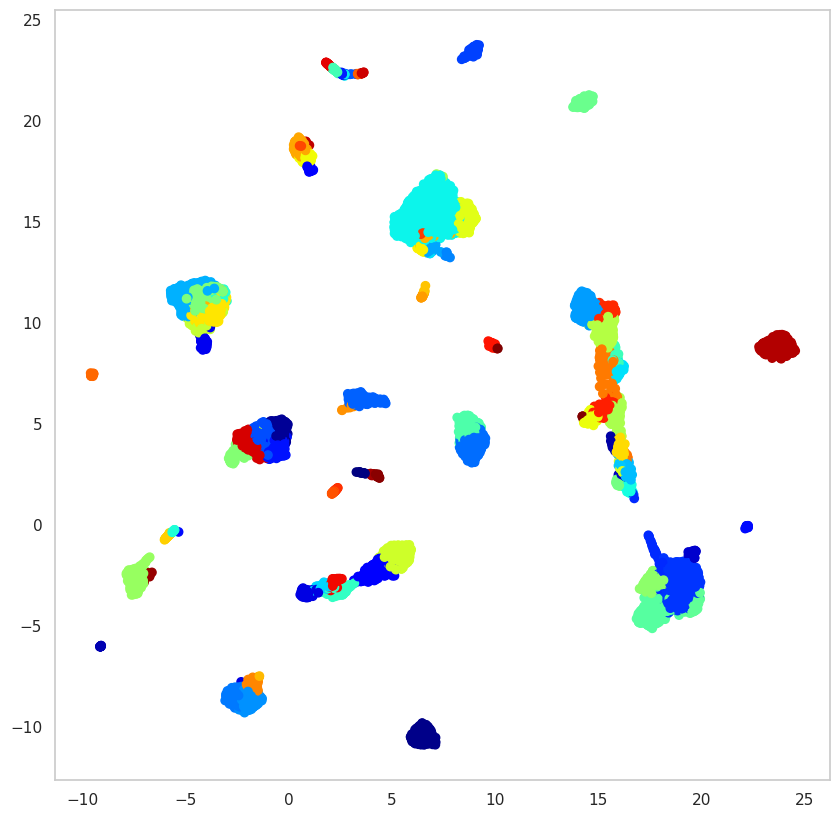

In [29]:
plt.figure(figsize=[10, 10])

ds.plot_umap(pca_dims=50, metric="correlation",  random_state=0, run_umap=True, umap_kwargs={'n_neighbors':100,'min_dist':0.3})

# assert False
# plt.savefig(outdir+'celltype_umap_'+local_max_ext+'_'+umap_ext+'.png', bbox_inches='tight')

# plt.close()

In [30]:
umap_df = pd.DataFrame(list((np.array(ds.local_maxs).T[ds.filtered_cluster_labels!=-1]).T)+[ds.cluster_labels.astype(int)[ds.filtered_cluster_labels!=-1]]+[d for d in ds.umap.T]).T
umap_df.columns = ['x','y','z','c','umap_0','umap_1']

umap_df.to_csv('umap_df.csv')
umap_df

,x,y,z,c,umap_0,umap_1
0,9.0,2732.0,0.0,10.0,5.083348,-2.465576
1,12.0,2678.0,0.0,37.0,2.775331,-3.313751
2,12.0,2718.0,0.0,10.0,3.935585,-2.681955
3,12.0,2767.0,0.0,10.0,4.947379,-2.461372
4,12.0,2839.0,0.0,54.0,5.687470,-1.893226
...,...,...,...,...,...,...
11415,2926.0,596.0,0.0,20.0,3.372908,6.163496
11416,2926.0,1542.0,0.0,25.0,13.993336,10.630028
11417,2926.0,2545.0,0.0,21.0,8.556252,3.472178
11418,2927.0,1355.0,0.0,33.0,7.587439,16.600956


In [31]:
centroids = pd.DataFrame(ds.centroids,columns=ds.genes)

xcorrs = []
for s in signatures.T:
    xcorrs.append(centroids.T.corrwith(signatures.T[s]))

xcorrs=pd.DataFrame((xcorrs),index=signatures.index)
maps = xcorrs.idxmax()
maps = maps.astype('category')


In [32]:
# print(maps[(maps == "L4/5 IT CTX")])

# maps_ = maps.copy()

# # manually correct subthalamic assignments
# maps[[2,6,13,16,31,43,88,96]]="CT SUB"


In [33]:
label_colors = maps.cat.codes[umap_df.c]

In [34]:
color_dict = pd.read_csv('../../data/mBrain/colors_for_celltypes-20221009T190957Z-001/colors_for_celltypes/subclass_label_42clust_colors.csv',index_col=0)
color_list = pd.merge(pd.Series(maps,name='subclass_label'),color_dict)

color_list

,subclass_label,subclass_color
0,SMC-Peri,#807059
1,L2/3 IT CTX,#0BE652
2,Endo,#8D6C62
3,Endo,#8D6C62
4,Endo,#8D6C62
...,...,...
86,L5 PT CTX,#0D5B78
87,L5 PT CTX,#0D5B78
88,Meis2,#FF0000
89,DG,#394FD3


/tmp/ipykernel_1098290/931191020.py:2: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  plt.scatter(*ds.umap.T,c=[color_dict.subclass_color[color_dict.subclass_label==m].iloc[0] for m in maps[umap_df.c.astype(int)]], cmap='jet',alpha=0.2, marker='.')


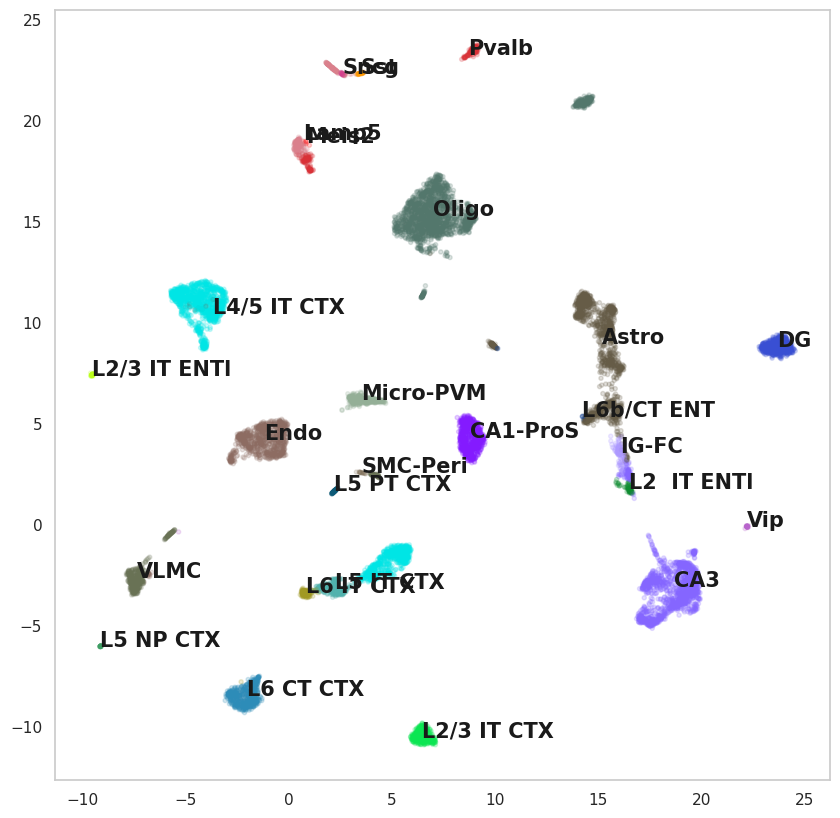

In [35]:
plt.figure(figsize=(10,10))
plt.scatter(*ds.umap.T,c=[color_dict.subclass_color[color_dict.subclass_label==m].iloc[0] for m in maps[umap_df.c.astype(int)]], cmap='jet',alpha=0.2, marker='.')

for i,label in enumerate(maps.cat.categories):
    
    clusters = maps[maps==label].index
    df_subset = umap_df[umap_df.c.isin(clusters.values)].median()
    plt.text(x=df_subset['umap_0'],y=df_subset['umap_1'],s=label,fontweight='bold',size=15,c='k')#c=color_dict[color_dict.subclass_label==label]['subclass_color'].iloc[0])
    
    

In [36]:
sergiosignments = {0: 'Perivascular_macrophages', 1: 'L2_3 IT', 2: 'Car4+ EC', -1: 'Car4+ EC', 3: 'Pericytes', 4: 'L5 NP', 5: 'Pericytes', 6: 'CA2_3', 7: 'Car4+ EC', 8: 'L6b CTX', 9: 'Thalamic EXC', 10: 'L4_5 IT', 11: 'INH Thal 2', 12: 'Vip INH', 13: 'Car4+ EC', 14: 'Lamp5 INH', 15: 'Astro1', 16: 'CA2_3', 17: 'Pvalb INH', 18: 'Car4+ EC', 19: 'Pvalb INH', 20: 'Perivascular_macrophages', 21: 'CA1', 22: 'L6b CTX', 23: 'Oligo', 24: 'L6b CTX', 25: 'Astro1', 26: 'Oligo', 27: 'L4_5 IT', 28: 'Microglia', 29: 'Microglia', 30: 'L5 IT', 31: 'Astro2', 32: 'Lamp5 INH', 33: 'Oligo', 34: 'Hippoth EXC', 35: 'VLMC', 36: 'Hippoth EXC', 37: 'L5 IT', 38: 'Astro1', 39: 'Lamp5 INH', 40: 'CA1', 41: 'CA2_3', 42: 'CA1', 43: 'Oligo', 44: 'L2_3 IT', 45: 'Hippoth EXC', 46: 'Car4+ EC', 47: 'CA1', 48: 'CP', 49: 'Oligo', 50: 'Astro2', 51: 'Astro1', 52: 'Astro1', 53: 'Thalamic EXC', 54: 'L4_5 IT', 55: 'Microglia', 56: 'Oligo', 57: 'Astro1', 58: 'INH Thal 3', 59: 'Oligo', 60: 'Hippoth EXC', 61: 'Microglia', 62: 'VLMC', 63: 'Oligo', 64: 'L6b CTX', 65: 'Oligo', 66: 'INH Thal 2', 67: 'Oligo', 68: 'Perivascular_macrophages', 69: 'L6b CTX', 70: 'Astro1', 71: 'Astro1', 72: 'Caudoputamen EXC', 73: 'Sst INH', 74: 'L5 PT', 75: 'INH Thal 2', 76: 'Oligo', 77: 'L5 PT', 78: 'Astro2', 79: 'Astro2', 80: 'Astro2', 81: 'L5 IT', 82: 'Lamp5 INH', 83: 'Car4- EC', 84: 'Sst INH', 85: 'Meis2 INH', 86: 'DG', 87: 'VLMC', 88: 'Car4- EC', 89: 'VLMC', 90: 'L6 CT Syt6'}

In [37]:
manual_labels=list(maps)

label_updates = {5:"IG-FC",9:"Thal",27:"Thal",34:"CA3",35:"undef",36:"Thal",44:"undef",45:"Thal",53:"Thal",60:"Thal",62:"undef",65:"undef",72:"Amyg",90:"undef"}

for i in label_updates:
    manual_labels[i] = label_updates[i]

# sergiosignments = {}
    
coi=0

In [38]:
sergiosignments[coi-1] = 'L6 CT Syt6'
print(sergiosignments)

{0: 'Perivascular_macrophages', 1: 'L2_3 IT', 2: 'Car4+ EC', -1: 'L6 CT Syt6', 3: 'Pericytes', 4: 'L5 NP', 5: 'Pericytes', 6: 'CA2_3', 7: 'Car4+ EC', 8: 'L6b CTX', 9: 'Thalamic EXC', 10: 'L4_5 IT', 11: 'INH Thal 2', 12: 'Vip INH', 13: 'Car4+ EC', 14: 'Lamp5 INH', 15: 'Astro1', 16: 'CA2_3', 17: 'Pvalb INH', 18: 'Car4+ EC', 19: 'Pvalb INH', 20: 'Perivascular_macrophages', 21: 'CA1', 22: 'L6b CTX', 23: 'Oligo', 24: 'L6b CTX', 25: 'Astro1', 26: 'Oligo', 27: 'L4_5 IT', 28: 'Microglia', 29: 'Microglia', 30: 'L5 IT', 31: 'Astro2', 32: 'Lamp5 INH', 33: 'Oligo', 34: 'Hippoth EXC', 35: 'VLMC', 36: 'Hippoth EXC', 37: 'L5 IT', 38: 'Astro1', 39: 'Lamp5 INH', 40: 'CA1', 41: 'CA2_3', 42: 'CA1', 43: 'Oligo', 44: 'L2_3 IT', 45: 'Hippoth EXC', 46: 'Car4+ EC', 47: 'CA1', 48: 'CP', 49: 'Oligo', 50: 'Astro2', 51: 'Astro1', 52: 'Astro1', 53: 'Thalamic EXC', 54: 'L4_5 IT', 55: 'Microglia', 56: 'Oligo', 57: 'Astro1', 58: 'INH Thal 3', 59: 'Oligo', 60: 'Hippoth EXC', 61: 'Microglia', 62: 'VLMC', 63: 'Oligo', 6

NameError: name 'sergio_color_list' is not defined

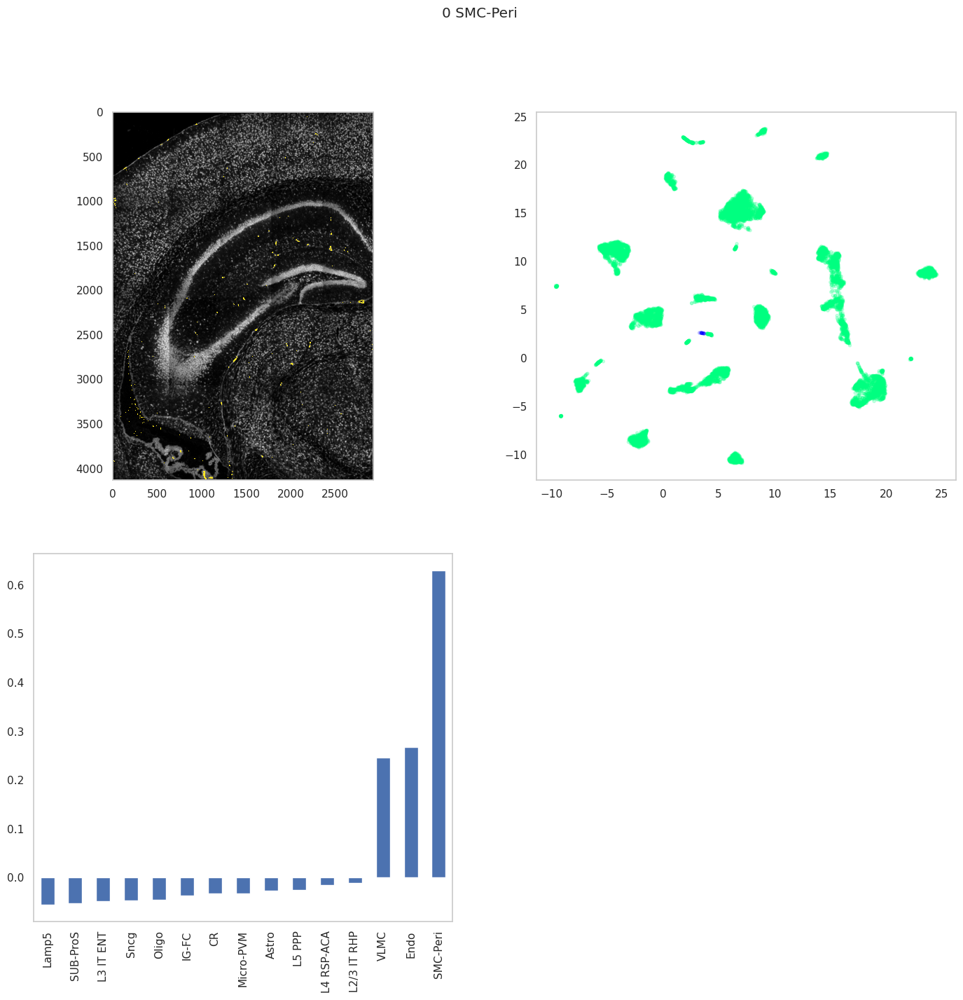

In [39]:

plt.figure(figsize=(17,15))

plt.suptitle(str(coi)+" "+maps[coi])

ax1 = plt.subplot(221)
plt.imshow(-ds.vf_norm.squeeze().T[::-1],cmap='Greys')
plt.imshow(ds.filtered_celltype_maps.squeeze().T[::-1]==coi,cmap='viridis',alpha=((ds.filtered_celltype_maps.squeeze().T[::-1]==coi).astype(float)),interpolation='none')

plt.subplot(222)#,sharex=ax1, sharey=ax1)


plt.scatter(*ds.umap.T,c=1-(umap_df.c==coi), cmap='winter',alpha=0.2, marker='.')

# for i,label in enumerate(maps.cat.categories):
    
#     clusters = maps[maps==label].index
#     df_subset = umap_df[umap_df.c.isin(clusters.values)].median()
#     plt.text(x=df_subset['umap_0'],y=df_subset['umap_1'],s=label,fontweight='bold',size=10,c='k')#c=color_dict[color_dict.subclass_label==label]['subclass_color'].iloc[0])
    
plt.subplot(223)
barplot_content = xcorrs[coi].sort_values()[-15:]
barplot_content.plot.bar()
plt.legend([plt.scatter([],[],color=c) for c in sergio_color_list.color.sort_index()],sorted(sergio_color_list.celltype_annotation),loc='lower right',ncol=2)


plt.subplot(224,sharex=ax1,sharey=ax1)
plt.scatter(sergio_assignments.obs.x_centroid,sergio_assignments.obs.y_centroid.max()-sergio_assignments.obs.y_centroid,c=sergio_color_series[sergio_assignments.obs.celltype_annotation],marker='o')



plt.tight_layout()

coi+=1

In [40]:
sergio_color_list = pd.read_csv('../../data/mBrain/celltype_annotation_to_color_nuclei.csv',delimiter=';',index_col=0)
sergio_color_list

sergio_assignments = anndata.read_h5ad('../../data/mBrain/adata_msbrain_3rep_withclusters_only_nuclei_deep_annotation_with_colors.h5ad')
sergio_assignments

AnnData object with n_obs × n_vars = 82941 × 284
    obs: 'ind', 'cell_id', 'x_centroid', 'y_centroid', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'graph_clusters', 'kmeans2_clusters', 'kmeans3_clusters', 'kmeans4_clusters', 'kmeans5_clusters', 'kmeans6_clusters', 'kmeans7_clusters', 'kmeans8_clusters', 'kmeans9_clusters', 'kmeans10_clusters', 'replicate', 'n_counts', 'leiden_2_2', 'leiden_1_8', 'leiden_1_4', 'leiden_1_0', 'leiden_0_8', 'leiden_0_6', 'cell_code', 'expanded_class', 'expanded_initial_annotation', 'Class', 'initial_annotation', 'celltype_annotation', 'X', 'Y', 'leiden_0_4', 'leiden_0_2', 'Class_old', 'class_number'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Class_colors', 'celltype_annotation_colors', 'dendrogram_celltype_annotation', 'dendrogram_initial_annotation', 'expanded_class_colors', 'expanded_initial_annotation_colors', 'hvg', 'initial_annotation_colors

In [41]:
from matplotlib.colors import ListedColormap

cmap = ListedColormap(['k']+list(sergio_color_list.color))

sergio_color_series = sergio_color_list.color
sergio_color_series.index = sergio_color_list.celltype_annotation

sergio_color_series
sergio_color_series[sergio_assignments.obs.celltype_annotation].values

array(['#53776C', '#d1ad62', '#53776C', ..., '#7044AA', '#2D8CB8',
       '#2D8CB8'], dtype=object)

In [42]:
sergiosignments = {0: 'Perivascular_macrophages', 1: 'L2_3 IT', 2: 'Car4+ EC', -1: 'Car4+ EC', 3: 'Pericytes', 4: 'L5 NP', 5: 'Pericytes', 6: 'CA2_3', 7: 'Car4+ EC', 8: 'L6 CT Syt6', 9: 'Thalamic EXC',
                   10: 'L4_5 IT', 11: 'INH Thal 2', 12: 'Vip INH', 13: 'Car4+ EC', 14: 'Lamp5 INH', 15: 'Astro1', 16: 'CA2_3', 17: 'Pvalb INH', 18: 'Car4+ EC', 19: 'Pvalb INH', 20: 'Perivascular_macrophages',
                   21: 'CA1', 22: 'L6 CT Syt6', 23: 'Oligo', 24: 'L6 CT Syt6', 25: 'Astro1', 26: 'Oligo', 27: 'L4_5 IT', 28: 'Oligo', 29: 'Oligo', 30: 'L5 IT', 31: 'Astro2', 32: 'Lamp5 INH', 33: 'Oligo', 
                   34: 'Oligo', 35: 'VLMC', 36: 'Oligo', 37: 'L5 IT', 38: 'Astro1', 39: 'Lamp5 INH', 40: 'CA1', 41: 'CA2_3', 42: 'CA1', 43: 'Oligo', 44: 'L2_3 IT', 45: 'Oligo', 46: 'Car4+ EC', 
                   47: 'CA1', 48: 'CP', 49: 'Oligo', 50: 'Astro2', 51: 'Astro1', 52: 'Astro1', 53: 'Thalamic EXC', 54: 'L4_5 IT', 55: 'Microglia', 56: 'Oligo', 57: 'Astro1', 58: 'INH Thal 3', 59: 'Oligo',
                   60: 'Oligo', 61: 'Oligo', 62: 'VLMC', 63: 'Oligo', 64: 'L6b CTX', 65: 'Oligo', 66: 'INH Thal 2', 67: 'Oligo', 68: 'Perivascular_macrophages', 69: 'L6b CTX', 70: 'Astro1',
                   71: 'Astro1', 72: 'Caudoputamen EXC', 73: 'Sst INH', 74: 'L5 PT', 75: 'INH Thal 2', 76: 'Oligo', 77: 'L5 PT', 78: 'Astro2',
                   79: 'Astro2', 80: 'Astro2', 81: 'L5 IT', 82: 'Lamp5 INH', 83: 'Car4- EC', 84: 'Sst INH', 85: 'Meis2 INH', 86: 'DG', 87: 'VLMC', 88: 'Car4- EC', 89: 'VLMC', 90: 'L6 CT Syt6'}

In [43]:
del sergiosignments[-1]

In [44]:
sergio_color_series = sergio_color_series.rename(index={'L5 IT ':'L5 IT'})


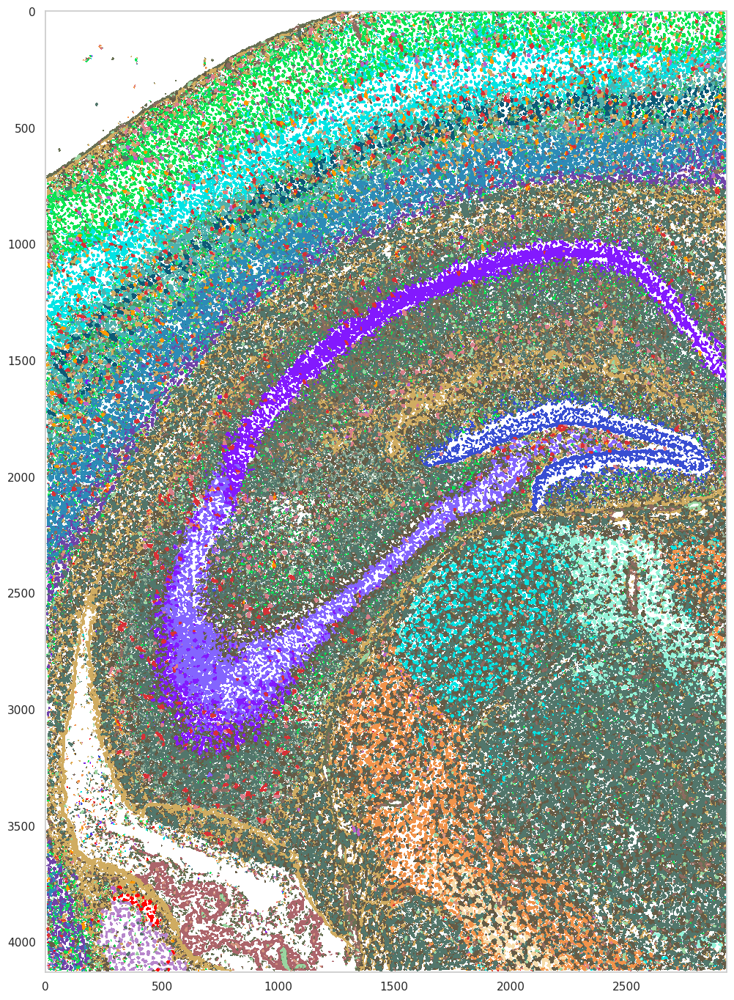

In [46]:
%matplotlib inline

from PIL import ImageColor
plt.figure(figsize=(12,20))

canvas = np.zeros(ds.filtered_celltype_maps.shape[-2::-1]+(4,))#.astype(int)+256

for i in range(ds.filtered_celltype_maps.max()):
    canvas[ds.filtered_celltype_maps.squeeze().T[::-1]==i,:3]=np.array(ImageColor.getrgb(sergio_color_series[sergiosignments[i]]))/256
    canvas[ds.filtered_celltype_maps.squeeze().T[::-1]==i,-1]=1.0
    
# canvas[ds.vf_norm.squeeze().T[::-1]<0.1]=0.0
plt.imshow(canvas,interpolation='none')
plt.savefig("ct_map_presentation-14-11-2022.png", transparent=True,dpi=300)

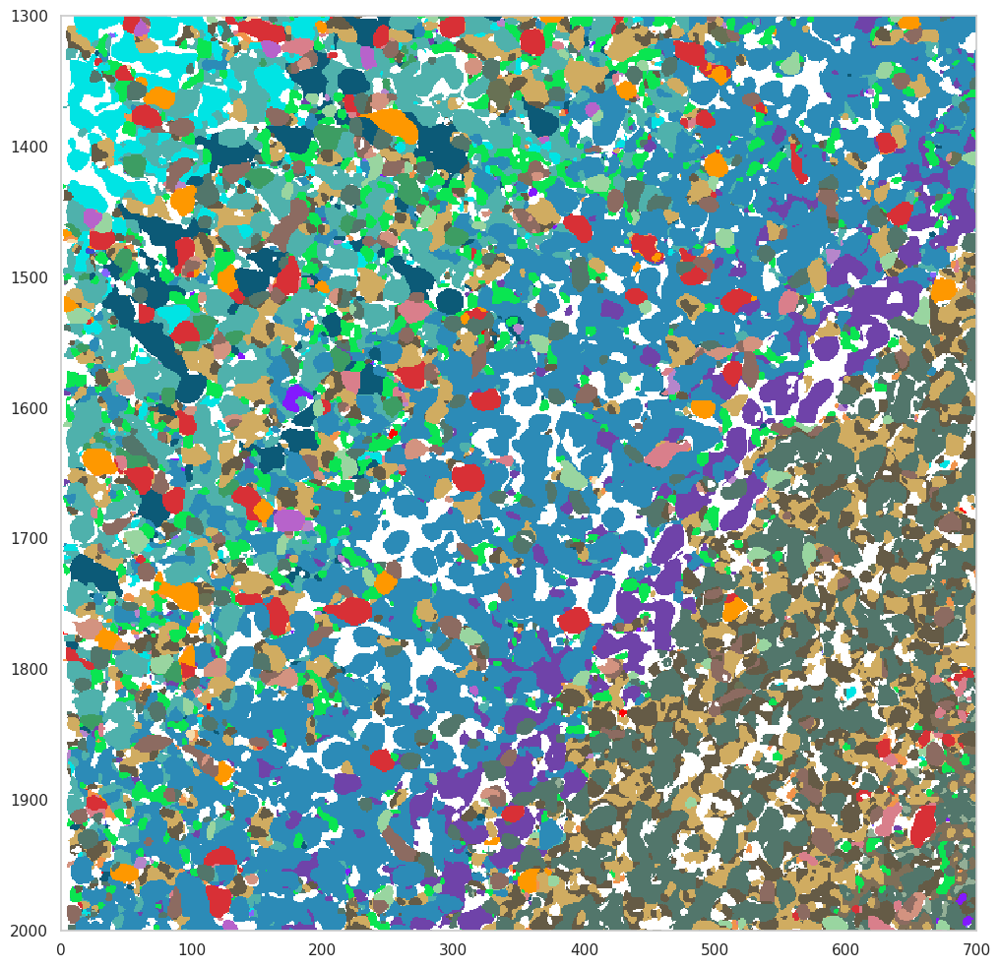

In [47]:
%matplotlib inline

from PIL import ImageColor
plt.figure(figsize=(12,20))

canvas = np.zeros(ds.filtered_celltype_maps.shape[-2::-1]+(4,))#.astype(int)+256

for i in range(ds.filtered_celltype_maps.max()):
    canvas[ds.filtered_celltype_maps.squeeze().T[::-1]==i,:3]=np.array(ImageColor.getrgb(sergio_color_series[sergiosignments[i]]))/256
    canvas[ds.filtered_celltype_maps.squeeze().T[::-1]==i,-1]=1.0
    
plt.xlim(0,700)
plt.ylim(2000,1300)
    
plt.imshow(canvas,interpolation='none')
plt.savefig("ct_map_presentation_detail-14-11-2022.png", transparent=True, dpi=300)